In [1]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
from sklearn.preprocessing import MinMaxScaler, StandardScaler

sns.set(style='darkgrid', palette='viridis', context='talk')

In [2]:
import datetime

In [3]:
datetime.date.today()

datetime.date(2022, 6, 15)

# Import

In [315]:
vivarium-ecoli/out/fbagd/unpruned_metabolism_10_2022-06-22

SyntaxError: leading zeros in decimal integer literals are not permitted; use an 0o prefix for octal integers (2012159650.py, line 1)

In [317]:
entry = 'unpruned_metabolism_10_2022-06-22'
folder = f'../out/fbagd/{entry}/'

In [318]:
output = np.load(folder + 'output.npy',allow_pickle='TRUE').item()
output = output['agents']['0']
fba = output['listeners']['fba_results']
mass = output['listeners']['mass']
bulk = pd.DataFrame(output['bulk'])

In [319]:
s_matrix = np.load(folder + 's_matrix.npy',allow_pickle='TRUE')
stoichiometry = np.load(folder + 'stoichiometry.npy',allow_pickle='TRUE')

In [320]:
fba.keys()

dict_keys(['estimated_fluxes', 'estimated_homeostatic_dmdt', 'target_homeostatic_dmdt', 'estimated_exchange_dmdt', 'estimated_all_dmdt', 'maintenance_target', 'solution_fluxes', 'solution_dmdt', 'solution_residuals', 'time_per_step'])

In [321]:
times = [time - fba['time_per_step'][1] for time in fba['time_per_step'][1:]]
time_diff = [(times[i+1] - times[i])/2 for i in range(len(times)-1)]
index = [i for i in range(len(times)-1)]

In [322]:
#f = sns.lineplot(index, time_diff)
# f.hlines(y=[2,4], xmin=0, xmax=500)
running_mean = np.convolve(time_diff, np.ones(10), 'valid') / 10
f = sns.lineplot(index[0:len(running_mean)], running_mean)
f.set_xlabel('Simulation step')
f.set_ylabel('Real second to simulation second')

/Users/cyrus/.pyenv/versions/3.9.9/envs/viv/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


ValueError: All arrays must be of the same length

In [324]:
fba['estimated_exchange_dmdt'].keys()

dict_keys(['ETOH[p]', 'NI+2[p]', 'GLC[p]', 'Pi[p]', 'UNDECAPRENYL-DIPHOSPHATE[p]', 'SULFATE[p]', 'CPD-534[p]', 'CARBON-MONOXIDE[p]', 'MG+2[p]', 'S-ADENOSYL-4-METHYLTHIO-2-OXOBUTANOATE[c]', 'HYDROGEN-MOLECULE[c]', 'MI-PENTAKISPHOSPHATE[p]', 'CH33ADO[c]', 'XANTHINE[p]', 'FORMATE[p]', 'METOH[p]', 'ZN+2[p]', 'CPD-564[c]', 'HYPOXANTHINE[p]', 'MN+2[p]', 'BETAINE[p]', 'NA+[p]', 'CPD-560[p]', 'PROTON[p]', 'CPD-239[p]', 'D-LACTATE[p]', 'CARBON-DIOXIDE[p]', 'THYMINE[p]', 'URACIL[p]', 'CA+2[p]', 'CL-[p]', 'K+[p]', 'GLYCEROL[p]', 'CPD-108[p]', 'ACET[p]', 'CPD-1772[c]', 'L-SELENOCYSTEINE[c]', 'CPD-10774[p]', 'CPD0-2167[c]', 'GLYCOLLATE[c]', 'OXYGEN-MOLECULE[p]', 'CO+2[p]', 'GLYCOLALDEHYDE[c]', 'SUC[p]', 'WATER[p]', 'UREA[p]', 'D-ALANINE[p]', 'AMMONIUM[c]', 'BUTANAL[c]', 'FE+2[p]', 'INDOLE[p]'])

In [329]:
sorted_exchange = pd.DataFrame(fba['estimated_exchange_dmdt']).sort_values(by=3, axis=1)
sorted_exchange.head()

,WATER[p],GLC[p],AMMONIUM[c],K+[p],SULFATE[p],MG+2[p],THYMINE[p],CL-[p],XANTHINE[p],OXYGEN-MOLECULE[p],...,UNDECAPRENYL-DIPHOSPHATE[p],ETOH[p],D-ALANINE[p],SUC[p],GLYCEROL[p],FORMATE[p],CARBON-DIOXIDE[p],ACET[p],HYDROGEN-MOLECULE[c],PROTON[p]
0,-661865,-938553,-69029,1,2,0,63,-3,28,-6,...,0,368379,70010,223371,18054,530924,569141,1074532,1136072,2285697
1,-1215501,-2447726,-588917,4,20,2,-56,-20,-138,10,...,19,131233,-68,319786,978624,1411051,1387903,2696140,3193830,5301628
2,-3472584,-2678445,-771519,-5662,-422,-254,-1,-164,-138,13,...,56,83764,121370,473614,986534,1336287,1423175,2834792,3420434,5850000
3,-5034365,-2788855,-1028333,-10232,-4299,-455,-439,-284,-99,-82,...,227,45594,291800,540960,952387,1241736,1396855,2815319,3472583,6087547
4,-6345394,-2862846,-1159040,-14020,-4929,-623,-19,-377,226,8,...,309,-35,439483,595257,887313,1173007,1433296,2777322,3492613,6140917


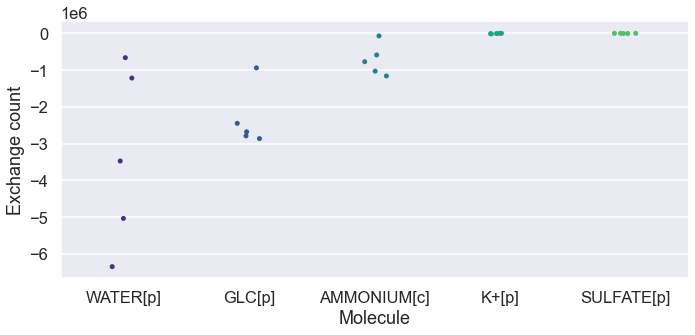

In [330]:
sns.catplot(y="Exchange count", x="Molecule", data=sorted_exchange.iloc[:,0:5].melt(var_name="Molecule", value_name="Exchange count"), aspect=2)

In [331]:
# fba['solution_residuals']['futile_cycle']

# Mass

<AxesSubplot:>

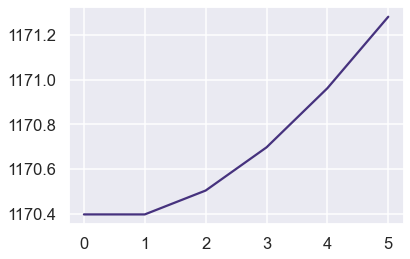

In [332]:
sns.lineplot(x=[i for i in range(len(mass['cell_mass']))],y=mass['cell_mass'])

# Meeting homeostatic objective

In [333]:
df1 = pd.DataFrame(fba['estimated_homeostatic_dmdt'])
df1.head()
# df1

,2-3-DIHYDROXYBENZOATE[c],2-KETOGLUTARATE[c],2-PG[c],2K-4CH3-PENTANOATE[c],4-AMINO-BUTYRATE[c],4-hydroxybenzoate[c],ACETOACETYL-COA[c],ACETYL-COA[c],ACETYL-P[c],ADENINE[c],...,glycogen-monomer[c],NI+2[p],CO+2[p],FE+2[p],ZN+2[p],MN+2[p],NA+[p],OXYGEN-MOLECULE[p],CA+2[p],Pi[p]
0,4,-3,-2,0,0,1,1,3,2,1,...,-1,0,0,2,0,0,-2,-6,0,2
1,28,-13,-21,-11,-4,-13,332,-27,-18,-158,...,66,1,0,3,0,0,0,10,15,-3
2,-27,37,-14,19,19,7,26,83,37,21,...,3794,0,4,-15,1,-3,5,13,-44,-29
3,36,25,-37,19,23,1,10,114,82,130,...,6972,3,7,10,2,-2,10,-82,-66,-18
4,3,58,7,16,46,13,-25,129,137,22,...,9575,6,11,0,7,0,12,8,-70,-6


In [334]:
df1 = df1.transpose().reset_index().melt(id_vars='index', var_name='timestep', value_name='update')


In [335]:
pd.DataFrame(fba['target_homeostatic_dmdt']).head()

,2-3-DIHYDROXYBENZOATE[c],2-KETOGLUTARATE[c],2-PG[c],2K-4CH3-PENTANOATE[c],4-AMINO-BUTYRATE[c],4-hydroxybenzoate[c],ACETOACETYL-COA[c],ACETYL-COA[c],ACETYL-P[c],ADENINE[c],...,glycogen-monomer[c],NI+2[p],CO+2[p],FE+2[p],ZN+2[p],MN+2[p],NA+[p],OXYGEN-MOLECULE[p],CA+2[p],Pi[p]
0,0,0,0,0,0,0,0,1,1,1,...,-1,0,0,0,0,0,0,0,0,0
1,-4,3,2,0,0,-1,360,-2,-1,0,...,-2,0,0,-2,0,0,2,38,22,4
2,-24,37,29,19,22,15,30,87,80,159,...,3795,5,6,1,6,6,8,33,13,13
3,18,37,52,15,35,14,7,116,156,139,...,6983,16,13,27,16,20,14,32,67,53
4,2,63,103,16,56,21,0,155,229,9,...,9577,27,20,31,28,36,18,128,148,85


In [336]:
df2 = pd.DataFrame(fba['target_homeostatic_dmdt'])
df2 = df2.transpose().reset_index().melt(id_vars='index', var_name='timestep', value_name='target')
df2

,index,timestep,target
0,2-3-DIHYDROXYBENZOATE[c],0,0
1,2-KETOGLUTARATE[c],0,0
2,2-PG[c],0,0
3,2K-4CH3-PENTANOATE[c],0,0
4,4-AMINO-BUTYRATE[c],0,0
...,...,...,...
850,MN+2[p],4,36
851,NA+[p],4,18
852,OXYGEN-MOLECULE[p],4,128
853,CA+2[p],4,148


In [337]:
df3 = df1.merge(df2, left_on=['index', 'timestep'], right_on=['index', 'timestep'])
# df3[df3['timestep'] == 900].T
df3

df3['update'] = df3['update'].abs() 
df3['target'] = df3['target'].abs() 

df3['update'] = np.log10(df3['update'])
df3['target'] = np.log10(df3['target'])
df3['diff'] = df3['target'] - df3['update']

df3

/Users/cyrus/.pyenv/versions/3.9.9/envs/viv/lib/python3.9/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


,index,timestep,update,target,diff
0,2-3-DIHYDROXYBENZOATE[c],0,0.602060,-inf,-inf
1,2-KETOGLUTARATE[c],0,0.477121,-inf,-inf
2,2-PG[c],0,0.301030,-inf,-inf
3,2K-4CH3-PENTANOATE[c],0,-inf,-inf,NaN
4,4-AMINO-BUTYRATE[c],0,-inf,-inf,NaN
...,...,...,...,...,...
850,MN+2[p],4,-inf,1.556303,inf
851,NA+[p],4,1.079181,1.255273,0.176091
852,OXYGEN-MOLECULE[p],4,0.903090,2.107210,1.204120
853,CA+2[p],4,1.845098,2.170262,0.325164


In [338]:
df3_subset = df3[df3['timestep'].isin([0, 1, 2, 10, 24, 100])]

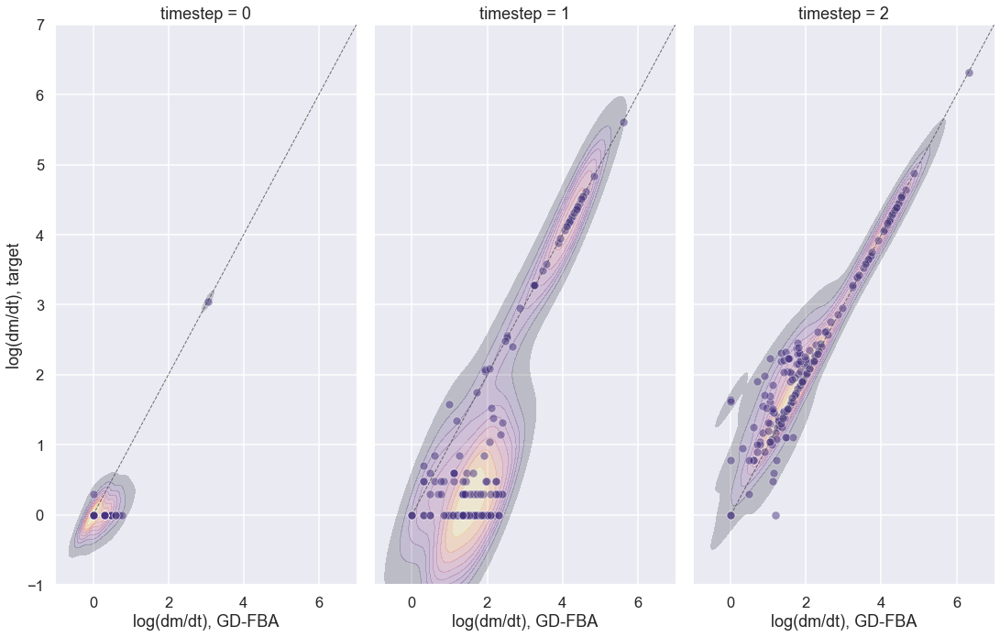

In [339]:
g = sns.FacetGrid(df3_subset, col="timestep", col_wrap=6, aspect=0.5, height=10, xlim=(-1,7), ylim=(-1,7))
g.map(sns.kdeplot, "update", "target", cmap="inferno", alpha=0.2, fill=True)
g.map(sns.scatterplot, "update", "target", alpha=0.5)
g.set_axis_labels("log(dm/dt), GD-FBA","log(dm/dt), target")

for ax in g.axes:
    ax.plot([0, 9], [0, 9], linewidth=1,  linestyle='--', color='.3', alpha=0.8)
    

plt.margins(0,0)

## Outliers?

In [340]:
df4 = df3.loc[df3['timestep'] == 25].reset_index(drop=True)
outliers = list(df4.loc[df4['diff']>1, 'index'])

<AxesSubplot:>

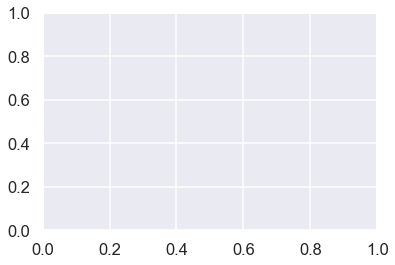

In [288]:
sns.histplot(x='diff', data=df4)

In [261]:
outliers

['ADP-D-GLUCOSE[c]',
 'APS[c]',
 'CAMP[c]',
 'CDP[c]',
 'DAMP[c]',
 'DPG[c]',
 'PROPIONYL-COA[c]',
 'QUINOLINATE[c]',
 'RIBOFLAVIN[c]',
 'RIBOSE-1P[c]',
 'UNDECAPRENYL-DIPHOSPHATE[c]',
 'CA+2[p]']

In [262]:
bulk.loc[35:40, outliers]

,ADP-D-GLUCOSE[c],APS[c],CAMP[c],CDP[c],DAMP[c],DPG[c],PROPIONYL-COA[c],QUINOLINATE[c],RIBOFLAVIN[c],RIBOSE-1P[c],UNDECAPRENYL-DIPHOSPHATE[c],CA+2[p]
35,2474,4147,8528,19666,5582,9958,3436,7541,12437,1817,16037,64109
36,2484,4166,8572,19670,5601,9950,3439,7547,12437,1807,16043,64141
37,2494,4172,8608,19685,5608,9961,3438,7550,12450,1809,16053,64171
38,2510,4180,8576,19710,5619,9981,3442,7549,12451,1818,16068,64200
39,2499,4171,8570,19712,5612,9981,3443,7554,12459,1817,16076,64233
40,2505,4181,8594,19722,5620,9984,3445,7557,12466,1816,16082,64267


In [263]:
pd.DataFrame(fba['target_homeostatic_dmdt']).loc[35:40, outliers]

,ADP-D-GLUCOSE[c],APS[c],CAMP[c],CDP[c],DAMP[c],DPG[c],PROPIONYL-COA[c],QUINOLINATE[c],RIBOFLAVIN[c],RIBOSE-1P[c],UNDECAPRENYL-DIPHOSPHATE[c],CA+2[p]
35,302,163,177,293,165,281,23,-65,-85,133,291,903
36,293,146,138,299,149,295,21,-67,-78,144,294,904
37,285,143,106,294,145,289,24,-66,-85,143,292,907
38,270,137,142,279,137,274,22,-61,-80,135,285,910
39,283,148,153,287,147,279,23,-63,-82,137,285,910
40,278,140,133,287,142,281,22,-62,-83,139,288,909


Doesn't look like they're going into negative at least. Are they being used?

I would guess that they're just not incentivized enough to reach their target completely, since all the diffs are in the 10-100 range. Magnitudes smaller than their conc. 

# Glucose transport

In [265]:
estimated_fluxes = pd.DataFrame(fba['estimated_fluxes'])
estimated_fluxes

,1-ACYLGLYCEROL-3-P-ACYLTRANSFER-RXN,1.1.1.127-RXN,1.1.1.215-RXN (reverse),1.1.1.251-RXN,1.1.1.271-RXN (reverse),1.1.1.274-RXN (reverse),1.1.1.283-RXN (reverse),1.1.1.39-RXN,1.1.1.83-RXN,1.11.1.15-RXN,...,XYLISOM-RXN,XYLISOM-RXN-BETA-D-XYLOSE//D-XYLULOSE.26.,XYLISOM-RXN-CPD-15377//D-XYLULOSE.22.,XYLISOM-RXN-XYLOSE//D-XYLULOSE.19.,XYLONATE-DEHYDRATASE-RXN,XYLULOKIN-RXN,YIAE1-RXN (reverse),YIAE2-RXN (reverse),glycogen-monomer-extension,maintenance_reaction
0,0,0,-15,0,0,-6,-10,0,0,0,...,-7,520239,-379783,-140450,0,0,6,-10,-1,1971173
1,-10,-2,22,6,42,12,-2,-4,0,3,...,-27,520185,-379749,-140417,31,-5,0,0,40,7128364
2,-15,32,-10,-3,-6,-12,-4,-21,-1,48,...,-21,520187,-379756,-140417,76,-4,9,-2,3739,7679636
3,18,2,7,87,-32,-2,-9,-15,1,12,...,-2,520159,-379784,-140359,47,17,7,-1,6916,7652295
4,29,7,3,100,16,-1,-11,-7,1,6,...,-19,520206,-379838,-140334,22,17,1,0,9602,7633135
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,87,1,-7,170,22,0,209,-62,1,3,...,-49,637901,-474252,-163601,1,0,-4,-4,27356,9859708
496,90,0,-1,175,23,1,0,-29,0,2,...,-6,638394,-474508,-163880,0,0,0,-2,27344,9895787
497,90,1,3,175,24,3,-28,0,0,2,...,-1,638698,-474743,-163954,0,0,-3,0,27413,9861670
498,85,0,-1,166,21,3,-7,-28,0,2,...,-123,638948,-474802,-164023,0,0,-3,-4,27475,9859102


In [266]:
fluxes = pd.DataFrame(fba['estimated_fluxes'])
cycle = fluxes.loc[:,['RXN0-7209-GLC//GLC.9.','RXN0-7247-GLC//GLC.9.']]
cycle.head()

cycle.columns = ['A->B', 'B->A']

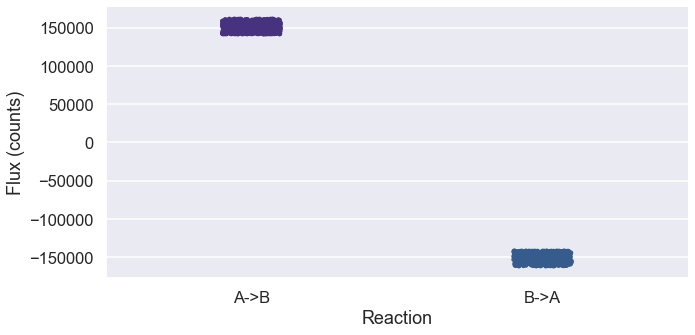

In [267]:
sns.catplot(y="Flux (counts)", x="Reaction", data=cycle.melt(var_name="Reaction", value_name="Flux (counts)"), aspect=2)

In [268]:
for reaction in stoichiometry:
    if 'GLC[p]' in reaction['stoichiometry'].keys():
        print(reaction['reaction id'],reaction['enzyme'], reaction['stoichiometry'],  fba['estimated_fluxes'][reaction['reaction id']][0:5],sep='\n')
        
# for reaction in stoichiometry:
#     if 'GLC[p]' in reaction['stoichiometry'].keys():
#         print(reaction['reaction id'], reaction['stoichiometry'],sep='\n')

3.2.1.21-RXN-Beta-D-glucosides/WATER//Non-Glucosylated-Glucose-Acceptors/GLC.64.
['EG12013-MONOMER[p]']
{'Beta-D-glucosides[p]': -1, 'WATER[p]': -1, 'Non-Glucosylated-Glucose-Acceptors[p]': 1, 'GLC[p]': 1}
[0, 16, -1, -5, -54]
GLUCOSE-1-PHOSPHAT-RXN[CCO-PERI-BAC]-GLC-1-P/WATER//GLC/Pi.36.
['ALKAPHOSPHA-CPLX[p]']
{'GLC-1-P[p]': -1, 'WATER[p]': -1, 'GLC[p]': 1, 'Pi[p]': 1}
[8, -32, 1, -7, 0]
GLUCOSE-1-PHOSPHAT-RXN[CCO-PERI-BAC]-GLC-1-P/WATER//GLC/Pi.36.__GLUCOSE-1-PHOSPHAT-CPLX
['GLUCOSE-1-PHOSPHAT-CPLX[p]']
{'GLC-1-P[p]': -1, 'WATER[p]': -1, 'GLC[p]': 1, 'Pi[p]': 1}
[8, -32, 1, -7, 0]
RXN0-6373-GLC/UBIQUINONE-8//GLC-D-LACTONE/CPD-9956.41.
['GLUCDEHYDROG-MONOMER[m]']
{'GLC[p]': -1, 'UBIQUINONE-8[i]': -1, 'GLC-D-LACTONE[p]': 1, 'CPD-9956[i]': 1}
[-8, -14, 254, 6, 2]
RXN0-6418
[]
{'GLC[p]': -1, 'D-Glucose[p]': 1}
[10, 53, 29, 70, -60]
RXN0-6418-GLC//CPD-15374.15.
[]
{'GLC[p]': -1, 'CPD-15374[p]': 1}
[10, 53, 29, 70, -60]
RXN0-7077-GLC/PROTON//ALPHA-GLUCOSE/PROTON.33.
['GALP-MONOMER[i]']
{'

We should look at the following:

In [90]:
glucose_transport_reactions = ['TRANS-RXN-157-PTSH-PHOSPHORYLATED/GLC//ALPHA-GLC-6-P/PTSH-MONOMER.52.',
                               'TRANS-RXN-157-PTSH-PHOSPHORYLATED/GLC//D-glucopyranose-6-phosphate/PTSH-MONOMER.66.',
                               'TRANS-RXN-157-PTSH-PHOSPHORYLATED/GLC//GLC-6-P/PTSH-MONOMER.46.',
                               'RXN0-7077-GLC/PROTON//ALPHA-GLUCOSE/PROTON.33.',
                               'RXN0-7077-GLC/PROTON//Glucopyranose/PROTON.33.',
                               'RXN0-7077-GLC/PROTON//GLC/PROTON.23.',
                               'TRANS-RXN0-574-GLC//GLC.9.',
                               'TRANS-RXN0-574-GLC//Glucopyranose.19.',
                               'TRANS-RXN-320-GLC/ATP/WATER//ALPHA-GLUCOSE/ADP/Pi/PROTON.43.',
                               'TRANS-RXN-320-GLC/ATP/WATER//GLC/ADP/Pi/PROTON.33.',
                               'TRANS-RXN-320-GLC/ATP/WATER//Glucopyranose/ADP/Pi/PROTON.43.']

In [91]:
for reaction in stoichiometry:
    if reaction['reaction id'] in glucose_transport_reactions:
        print(reaction['reaction id'], reaction['stoichiometry'],  fba['estimated_fluxes'][reaction['reaction id']][0:5],sep='\n')

RXN0-7077-GLC/PROTON//ALPHA-GLUCOSE/PROTON.33.
{'GLC[p]': -1, 'PROTON[p]': -1, 'ALPHA-GLUCOSE[c]': 1, 'PROTON[c]': 1}
[0, 0, 0, 0, 0]
RXN0-7077-GLC/PROTON//GLC/PROTON.23.
{'GLC[p]': -1, 'PROTON[p]': -1, 'GLC[c]': 1, 'PROTON[c]': 1}
[0, 0, 0, 0, 0]
RXN0-7077-GLC/PROTON//Glucopyranose/PROTON.33.
{'GLC[p]': -1, 'PROTON[p]': -1, 'Glucopyranose[c]': 1, 'PROTON[c]': 1}
[0, 0, 0, 0, 0]
TRANS-RXN-157-PTSH-PHOSPHORYLATED/GLC//ALPHA-GLC-6-P/PTSH-MONOMER.52.
{'PTSH-PHOSPHORYLATED[c]': -1, 'GLC[p]': -1, 'ALPHA-GLC-6-P[c]': 1, 'PTSH-MONOMER[c]': 1}
[170026, 757122, 810312, 823640, 827659]
TRANS-RXN-157-PTSH-PHOSPHORYLATED/GLC//D-glucopyranose-6-phosphate/PTSH-MONOMER.66.
{'PTSH-PHOSPHORYLATED[c]': -1, 'GLC[p]': -1, 'D-glucopyranose-6-phosphate[c]': 1, 'PTSH-MONOMER[c]': 1}
[146613, 764304, 830886, 859780, 869326]
TRANS-RXN-157-PTSH-PHOSPHORYLATED/GLC//GLC-6-P/PTSH-MONOMER.46.
{'PTSH-PHOSPHORYLATED[c]': -1, 'GLC[p]': -1, 'GLC-6-P[c]': 1, 'PTSH-MONOMER[c]': 1}
[279651, 912927, 981952, 1023668, 104415

# How much glucose is being used?

In [92]:
fluxes = pd.DataFrame(fba['estimated_fluxes'])
influx = fluxes.loc[:,glucose_transport_reactions]
influx.head()

influx.columns = ['PTS-1', 'PTS-2', 'PTS-3', 'DIF-1', 'DIF-2', 'DIF-3', 'DIF-4', 'DIF-5', 'DUP-1', 'DUP-2', 'DUP-3']

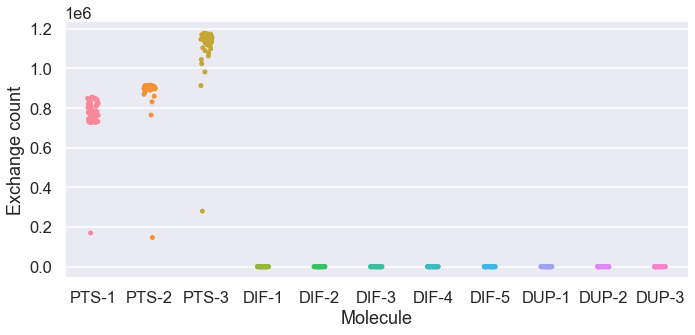

In [93]:
sns.catplot(y="Exchange count", x="Molecule", data=influx.melt(var_name="Molecule", value_name="Exchange count"), aspect=2)

In [94]:
influx.sum(axis=1)

0      596290
1     2434350
2     2623150
3     2707088
4     2741136
5     2771458
6     2808533
7     2834541
8     2860184
9     2849313
10    2868487
11    2877635
12    2868116
13    2881391
14    2885713
15    2868128
16    2876353
17    2880486
18    2878837
19    2876627
20    2862174
21    2857146
22    2857780
23    2832504
24    2836911
25    2833795
26    2836611
27    2840200
28    2847628
29    2844364
30    2844129
31    2839258
32    2844908
33    2842748
34    2828938
35    2835206
36    2827358
37    2812647
38    2813074
39    2811900
40    2801683
41    2800299
42    2797408
43    2800287
44    2801539
45    2802076
46    2797652
47    2798464
48    2800866
49    2802508
dtype: int64

In [116]:
exchanges = pd.DataFrame(fba['estimated_exchange_dmdt'])
exchanges['GLC[p]']

0     -596366
1    -2434337
2    -2623185
3    -2706891
4    -2740744
5    -2770680
6    -2807192
7    -2835450
8    -2862152
9    -2847825
10   -2867692
11   -2877641
12   -2867303
13   -2880919
14   -2883290
15   -2867884
16   -2876106
17   -2879215
18   -2877509
19   -2875702
20   -2861214
21   -2856375
22   -2857098
23   -2832522
24   -2836932
25   -2832716
26   -2836414
27   -2840530
28   -2847109
29   -2843534
30   -2843310
31   -2838507
32   -2842688
33   -2839722
34   -2828983
35   -2834684
36   -2827926
37   -2811945
38   -2812386
39   -2812146
40   -2801146
41   -2799757
42   -2797055
43   -2800290
44   -2801676
45   -2802946
46   -2797017
47   -2798658
48   -2800126
49   -2801821
Name: GLC[p], dtype: int64

Looks like that's all of it.

## What's the flux coming from Glc[p]?

In [117]:
sol_fluxes = pd.DataFrame(fba['solution_fluxes'])
sol_fluxes.loc[:,glucose_transport_reactions]

,TRANS-RXN-157-PTSH-PHOSPHORYLATED/GLC//ALPHA-GLC-6-P/PTSH-MONOMER.52.,TRANS-RXN-157-PTSH-PHOSPHORYLATED/GLC//D-glucopyranose-6-phosphate/PTSH-MONOMER.66.,TRANS-RXN-157-PTSH-PHOSPHORYLATED/GLC//GLC-6-P/PTSH-MONOMER.46.,RXN0-7077-GLC/PROTON//ALPHA-GLUCOSE/PROTON.33.,RXN0-7077-GLC/PROTON//Glucopyranose/PROTON.33.,RXN0-7077-GLC/PROTON//GLC/PROTON.23.,TRANS-RXN0-574-GLC//GLC.9.,TRANS-RXN0-574-GLC//Glucopyranose.19.,TRANS-RXN-320-GLC/ATP/WATER//ALPHA-GLUCOSE/ADP/Pi/PROTON.43.,TRANS-RXN-320-GLC/ATP/WATER//GLC/ADP/Pi/PROTON.33.,TRANS-RXN-320-GLC/ATP/WATER//Glucopyranose/ADP/Pi/PROTON.43.
0,0.132677,0.114406,0.218220,-6.611509e-08,-3.274904e-08,-3.107561e-08,1.229171e-07,1.213076e-07,-1.635083e-07,-1.284609e-07,-1.301382e-07
1,0.590805,0.596410,0.712385,-9.057390e-08,-8.617511e-08,-7.446436e-08,-2.251710e-08,-3.420088e-08,-9.904888e-07,-9.745624e-07,-9.860552e-07
2,0.632253,0.648306,0.766177,-3.487942e-08,-3.224452e-08,-2.461099e-08,1.481374e-08,6.873598e-09,-2.903528e-07,-2.799713e-07,-2.880516e-07
3,0.642547,0.670741,0.798595,-5.257237e-08,-7.717938e-08,-7.676509e-08,-6.044157e-08,-6.080293e-08,-9.991288e-08,-1.242160e-07,-1.245113e-07
4,0.645536,0.678034,0.814390,-5.091829e-08,-7.129881e-08,-6.780007e-08,-5.074244e-08,-5.423318e-08,-9.994361e-08,-1.167963e-07,-1.203285e-07
5,0.646660,0.685825,0.828535,-1.794494e-08,-2.027518e-08,-1.395112e-08,-4.750545e-09,-1.110406e-08,-3.009462e-08,-2.617537e-08,-3.258593e-08
6,0.654699,0.693944,0.840603,-1.505332e-07,-1.473195e-07,-1.398775e-07,-1.046383e-07,-1.121409e-07,-2.647368e-07,-2.541317e-07,-2.614739e-07
7,0.661506,0.698773,0.848496,-3.203926e-07,-3.159233e-07,-3.118056e-07,-1.379551e-08,-1.785216e-08,-1.267035e-06,-1.258493e-06,-1.262634e-06
8,0.666664,0.705485,0.855833,-3.957625e-06,-2.182769e-06,-7.512173e-07,-7.884221e-07,-2.277031e-06,-4.902864e-06,-1.568981e-06,-3.057543e-06
9,0.656318,0.702821,0.859523,-7.047988e-08,-6.769363e-08,-6.453962e-08,-5.390761e-08,-5.699466e-08,-1.083907e-07,-1.023989e-07,-1.054460e-07


In [118]:
pd.DataFrame(fba['estimated_fluxes']).head()

,1-ACYLGLYCEROL-3-P-ACYLTRANSFER-RXN,1.1.1.127-RXN,1.1.1.215-RXN (reverse),1.1.1.251-RXN,1.1.1.271-RXN (reverse),1.1.1.274-RXN (reverse),1.1.1.283-RXN (reverse),1.1.1.39-RXN,1.1.1.83-RXN,1.11.1.15-RXN,...,XYLISOM-RXN,XYLISOM-RXN-BETA-D-XYLOSE//D-XYLULOSE.26.,XYLISOM-RXN-CPD-15377//D-XYLULOSE.22.,XYLISOM-RXN-XYLOSE//D-XYLULOSE.19.,XYLONATE-DEHYDRATASE-RXN,XYLULOKIN-RXN,YIAE1-RXN (reverse),YIAE2-RXN (reverse),glycogen-monomer-extension,maintenance_reaction
0,0,-10,-1,3,-2,-4,-3,-1,9,0,...,-45,-463869,315325,148563,7,-24,14,0,-1,1971173
1,10,-5,5,24,81,0,-9,-6,0,-4,...,-41,-504152,395893,108297,32,-2,0,-2,66,7128363
2,3,-3,-2,71,-13,-3,-6,-11,1,0,...,-37,-518080,423751,94379,28,17,12,-3,3783,7679647
3,37,1,-1,85,18,0,-7,-1,0,1,...,-13,-542990,473481,69520,3,-1,1,-1,6975,7652307
4,38,3,-1,92,31,-1,-10,-8,-1,2,...,39,-557313,501929,55343,3,-1,0,-1,9608,7633143


# Hmm

In [119]:
for reaction in stoichiometry:
    if 'CPD-564[c]' in reaction['stoichiometry'].keys():
        print(reaction['reaction id'], reaction['stoichiometry'],  fba['estimated_fluxes'][reaction['reaction id']][0:5],sep='\n')

ADENOSYLHOMOCYSTEINE-NUCLEOSIDASE-RXN
{'ADENOSYL-HOMO-CYS[c]': -1, 'WATER[c]': -1, 'CPD-564[c]': 1, 'ADENINE[c]': 1}
[-26, 491, 74, 11, 120]
RIBOSYLHOMOCYSTEINASE-RXN
{'CPD-564[c]': -1, 'HOMO-CYS[c]': 1, 'DIHYDROXYPENTANEDIONE[c]': 1}
[-25, 504, 97, 24, 148]
TRANS-RXN0-265-CPD-564//CPD-564.17.
{'CPD-564[c]': -1, 'CPD-564[p]': 1}
[-1, -5, -10, -5, -11]


In [120]:
for reaction in stoichiometry:
    if 'DIHYDROXYPENTANEDIONE[c]' in reaction['stoichiometry'].keys():
        print(reaction['reaction id'], reaction['stoichiometry'],  fba['estimated_fluxes'][reaction['reaction id']][0:5],sep='\n')

RIBOSYLHOMOCYSTEINASE-RXN
{'CPD-564[c]': -1, 'HOMO-CYS[c]': 1, 'DIHYDROXYPENTANEDIONE[c]': 1}
[-25, 504, 97, 24, 148]
RXN-10015
{'DIHYDROXYPENTANEDIONE[c]': -1, 'CPD-10773[c]': 1}
[-1, -1, -3, -1, -3]
RXN-10016
{'DIHYDROXYPENTANEDIONE[c]': -1, 'CPD-10775[c]': 1}
[-2, -1, -3, -1, -1]
RXN0-5461
{'DIHYDROXYPENTANEDIONE[c]': -1, 'ATP[c]': -1, 'CPD-10551[c]': 1, 'ADP[c]': 1, 'PROTON[c]': 1}
[-20, 506, 106, 25, 152]


In [121]:
for reaction in stoichiometry:
    if 'CPD-10551[c]' in reaction['stoichiometry'].keys():
        print(reaction['reaction id'], reaction['stoichiometry'],  fba['estimated_fluxes'][reaction['reaction id']][0:5],sep='\n')

RXN-15216
{'CPD-10551[c]': -1, 'CPD0-2467[c]': 1}
[-15, 539, 168, 109, 242]
RXN0-5461
{'DIHYDROXYPENTANEDIONE[c]': -1, 'ATP[c]': -1, 'CPD-10551[c]': 1, 'ADP[c]': 1, 'PROTON[c]': 1}
[-20, 506, 106, 25, 152]


In [122]:
for reaction in stoichiometry:
    if 'CPD0-2467[c]' in reaction['stoichiometry'].keys():
        print(reaction['reaction id'], reaction['stoichiometry'],  fba['estimated_fluxes'][reaction['reaction id']][0:5],sep='\n')

RXN-15216
{'CPD-10551[c]': -1, 'CPD0-2467[c]': 1}
[-15, 539, 168, 109, 242]
RXN-15943 (reverse)
{'DIHYDROXY-ACETONE-PHOSPHATE[c]': 1, 'ACETYL-COA[c]': 1, 'CPD0-2467[c]': -1, 'CO-A[c]': -1}
[-10, 604, 303, 279, 424]
RXN0-6720
{'CPD0-2467[c]': -1, 'WATER[c]': -1, 'CPD0-2468[c]': 1}
[-2, -34, -72, -86, -92]


## Get top fluxes

In [123]:
top_fluxes = list(fluxes.sort_values(axis=1, by=49, ascending=False).columns[0:50])
top_fluxes

['maintenance_reaction',
 'TRANS-RXN-145',
 'TRANS-RXN0-547[CCO-PM-BAC-NEG]-WATER//WATER.29.',
 'RXN0-5388-CPD-9728/NADH/PROTON//REDUCED-MENAQUINONE/NAD/PROTON.53.',
 'GAPOXNPHOSPHN-RXN',
 '2PGADEHYDRAT-RXN',
 'RXN0-7166',
 'TRANS-RXN-300',
 'RXN0-313',
 'PYRUVDEH-RXN',
 'PHOSACETYLTRANS-RXN__CPLX0-7912',
 'PHOSACETYLTRANS-RXN__PHOSACETYLTRANS-CPLX',
 'TRANS-RXN0-517-SUC/PROTON//SUC/PROTON.23.',
 'SEDOBISALDOL-RXN',
 'RXN0-6541',
 'TRANS-RXN-157-PTSH-PHOSPHORYLATED/GLC//GLC-6-P/PTSH-MONOMER.46.',
 'RXN-16000',
 'PGLUCISOM-RXN',
 'RXN0-2022-PYRUVATE/ACETALD/PROTON//CPD-255/CARBON-DIOXIDE.48.',
 'PEPCARBOX-RXN (reverse)',
 '2.7.1.121-RXN',
 'RXN0-6717',
 'RXN0-6718',
 'TRANS-RXN-157-PTSH-PHOSPHORYLATED/GLC//D-glucopyranose-6-phosphate/PTSH-MONOMER.66.',
 'RXN-13163',
 'XYLISOM-RXN-CPD-15377//D-XYLULOSE.22.',
 'SORB6PDEHYDROG-RXN-D-SORBITOL-6-P/NAD//FRUCTOSE-6P/NADH/PROTON.44.',
 'PGLUCISOM-RXN-ALPHA-GLC-6-P//FRUCTOSE-6P.27.',
 'PGLUCISOM-RXN-GLC-6-P//FRUCTOSE-6P.21.',
 'TRANS-RXN-157-PTS

In [130]:
df3[df3['index'].isin(top_fluxes)]

,index,timestep,update,target,diff


# Check target goal

/Users/cyrus/.pyenv/versions/3.9.9/envs/viv/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

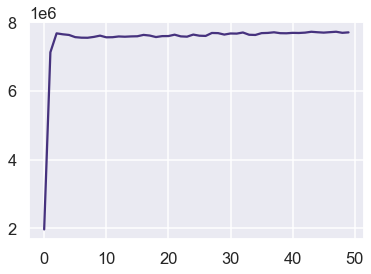

In [125]:
maintenance = fba['estimated_fluxes']['maintenance_reaction']
sns.lineplot([i for i in range(len(maintenance))], maintenance)

In [126]:
bulk_data = bulk.iloc[-1, :]
bulk_data

CPLX-125[c]          7
CPLX-172[c]          0
CPLX0-226[c]       115
CPLX0-228[c]        18
CPLX0-7669[c]      119
                  ... 
undecaprenyl[m]      0
undecaprenyl[o]      0
undecaprenyl[p]      0
undecaprenyl[l]      0
undecaprenyl[i]      0
Name: 50, Length: 40889, dtype: int64

In [127]:
min(flux_data)

-1.0

In [128]:
flux_data = pd.DataFrame(fba['estimated_fluxes']).iloc[-1, :]

In [129]:
# scaler = StandardScaler()
# flux_values = scaler.fit_transform(np.array(flux_data).reshape(-1, 1)).reshape(-1)
scaler = MinMaxScaler(feature_range=(-1, max(flux_data)/(abs(min(flux_data)))))
flux_values = scaler.fit_transform(np.array(flux_data).reshape(-1, 1)).reshape(-1)
flux_data.iloc[:] = flux_values.tolist()

flux_data

1-ACYLGLYCEROL-3-P-ACYLTRANSFER-RXN    0.000015
1.1.1.127-RXN                          0.000000
1.1.1.215-RXN (reverse)                0.000000
1.1.1.251-RXN                          0.000032
1.1.1.271-RXN (reverse)                0.000003
                                         ...   
XYLULOKIN-RXN                          0.000000
YIAE1-RXN (reverse)                    0.000000
YIAE2-RXN (reverse)                    0.000000
glycogen-monomer-extension             0.004419
maintenance_reaction                   1.580138
Name: 49, Length: 4688, dtype: float64

In [109]:
cofactors = [
 'PROTON[c]',
 'WATER[c]',
 'OXYGEN-MOLECULE[c]',
 'PROTON[p]',
 'WATER[p]',
 'Pi[c]',
 'PPI[c]',
 'Pi[p]']

In [110]:
G = nx.Graph()

for reaction in stoichiometry:
    for metabolite in list(reaction['stoichiometry'].keys()):
        if metabolite in bulk_data.index:
            G.add_node(metabolite, size=20*np.log(100+abs(bulk_data[metabolite])))
        else:
            G.add_node(metabolite, size=10)

    for reactant in list(reaction['stoichiometry'].keys()):
        if reaction['stoichiometry'][reactant] < 0:
            for product in list(reaction['stoichiometry'].keys()):
                if reaction['stoichiometry'][product] > 0:
                    if G.has_edge(reactant, product):
                        G.edges[reactant, product]['weight'] += 20*flux_data[reaction['reaction id']]
                    else:
                        G.add_edge(reactant, product, weight=20*flux_data[reaction['reaction id']])


                    
# prune smaller graphs away
for subgraph in [G.subgraph(c) for c in nx.connected_components(G)]:
    if subgraph.size() < 100:
        print(subgraph.nodes())
        # G.remove_nodes_from(subgraph.nodes())
        
# remove highly connected nodes (e.g. protons)
highly_connected_nodes = list()
for node in G.nodes():
    if G.degree(node) > 50:
        highly_connected_nodes.append(node)
        
# G.remove_nodes_from(highly_connected_nodes)
G.remove_nodes_from(cofactors)


['PHOSPHO-ARCB-ASP[CCI-PM-BAC-NEG-GN]', 'PHOSPHO-ARCB-HIS[CCI-PM-BAC-NEG-GN]', 'Pi[NIL]', 'ARCB-CPLX[CCI-PM-BAC-NEG-GN]', 'PHOSPHO-ARCB717[CCI-PM-BAC-NEG-GN]']
['BAES-MONOMER[CCI-PM-BAC-NEG-GN]', 'PHOSPHO-BAES[CCI-PM-BAC-NEG-GN]', 'BAER-MONOMER[c]', 'PHOSPHO-BAER[c]']
['D-ALANINE[CCI-PERI-BAC-GN]', 'Proteins-L-Threonines[CCI-PERI-BAC-GN]', 'MI-PENTAKISPHOSPHATE[CCI-PERI-BAC-GN]', 'UNDECAPRENYL-DIPHOSPHATE[CCI-PERI-BAC-GN]', 'CPD-9646[CCI-PERI-BAC-GN]', 'GDP[CCI-PERI-BAC-GN]', 'CPD-606[CCI-PERI-BAC-GN]', 'Protein-flavinated-threonines[CCI-PERI-BAC-GN]', 'ADP[CCI-PERI-BAC-GN]', 'CPD-18902[CCI-PERI-BAC-GN]', 'CPD-6746[CCI-PERI-BAC-GN]', 'CYTIDINE[CCI-PERI-BAC-GN]', 'FAD[CCI-PERI-BAC-GN]', 'WATER[CCI-PERI-BAC-GN]', 'CPD-17926[CCI-PERI-BAC-GN]', 'CPD-18903[CCI-PERI-BAC-GN]', 'GLYCEROL-3P[CCI-PERI-BAC-GN]', 'CPD-17927[CCI-PERI-BAC-GN]', 'PROTON[CCI-PERI-BAC-GN]', 'AMP[CCI-PERI-BAC-GN]', 'CPD-18901[CCI-PERI-BAC-GN]', 'GTP[CCI-PERI-BAC-GN]', 'ADENOSINE5TRIPHOSPHO5ADENOSINE[CCI-PERI-BAC-GN]', '

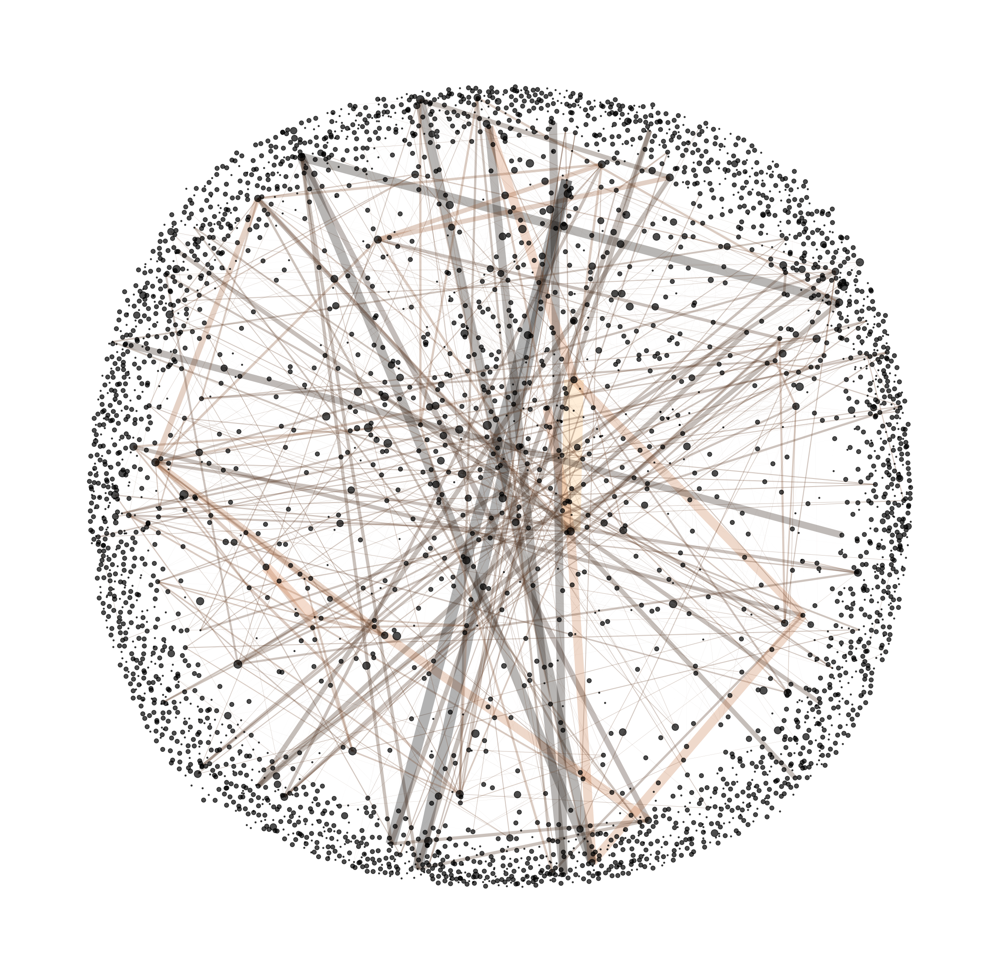

In [111]:
widths = nx.get_edge_attributes(G, 'weight')
sizes = nx.get_node_attributes(G, 'size')
nodelist = G.nodes()

plt.figure(figsize=(40,40))

pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G,pos,
                       nodelist=nodelist,
                       node_size=list(sizes.values()),
                       node_color='black',
                       alpha=0.7)
nx.draw_networkx_edges(G,pos,
                       edgelist = widths.keys(),
                       width=list(widths.values()),
                       edge_color=list(widths.values()),
                       # edge_color='lightblue',
                       alpha=0.3,
                       edge_cmap=plt.cm.copper)
# nx.draw_networkx_labels(G, pos=pos,
#                         labels=dict(zip(nodelist,nodelist)),
#                         font_color='black')
plt.box(False)
plt.show()

# consider shell layout or multipartite

In [112]:
important_exchanges = pd.DataFrame(fba['estimated_exchange_dmdt']).iloc[-1, :]
important_exchanges = important_exchanges[abs(important_exchanges) > 1000]

important_homeostatic = pd.DataFrame(fba['estimated_homeostatic_dmdt']).iloc[-1, :]
important_homeostatic = important_homeostatic[abs(important_homeostatic) > 1000]

In [113]:
exchange_metabolites = set(important_exchanges.index).intersection(set(G.nodes()))
homeostatic_metabolites = set(important_homeostatic.index).intersection(set(G.nodes()))

# exchange_metabolites = set(fba['estimated_exchange_dmdt'].keys()).intersection(set(G.nodes()))
# homeostatic_metabolites = set(fba['estimated_homeostatic_dmdt'].keys()).intersection(set(G.nodes()))

In [114]:
shortest_paths = nx.multi_source_dijkstra_path_length(G, sources=exchange_metabolites, cutoff=None, weight=1)
shortest_paths_target = nx.multi_source_dijkstra_path_length(G, sources=homeostatic_metabolites, cutoff=None, weight=1)

In [115]:
n_bins = max(shortest_paths.values()) + 1

In [46]:
bins = [[] for x in range(n_bins)]

for key, value in shortest_paths.items():
    bins[value].append(key)

In [47]:
weird_nodes = set(G.nodes()) - set(shortest_paths.keys())
display_nodes = set(shortest_paths.keys()).intersection(set(G.nodes()))
G.remove_nodes_from(weird_nodes)

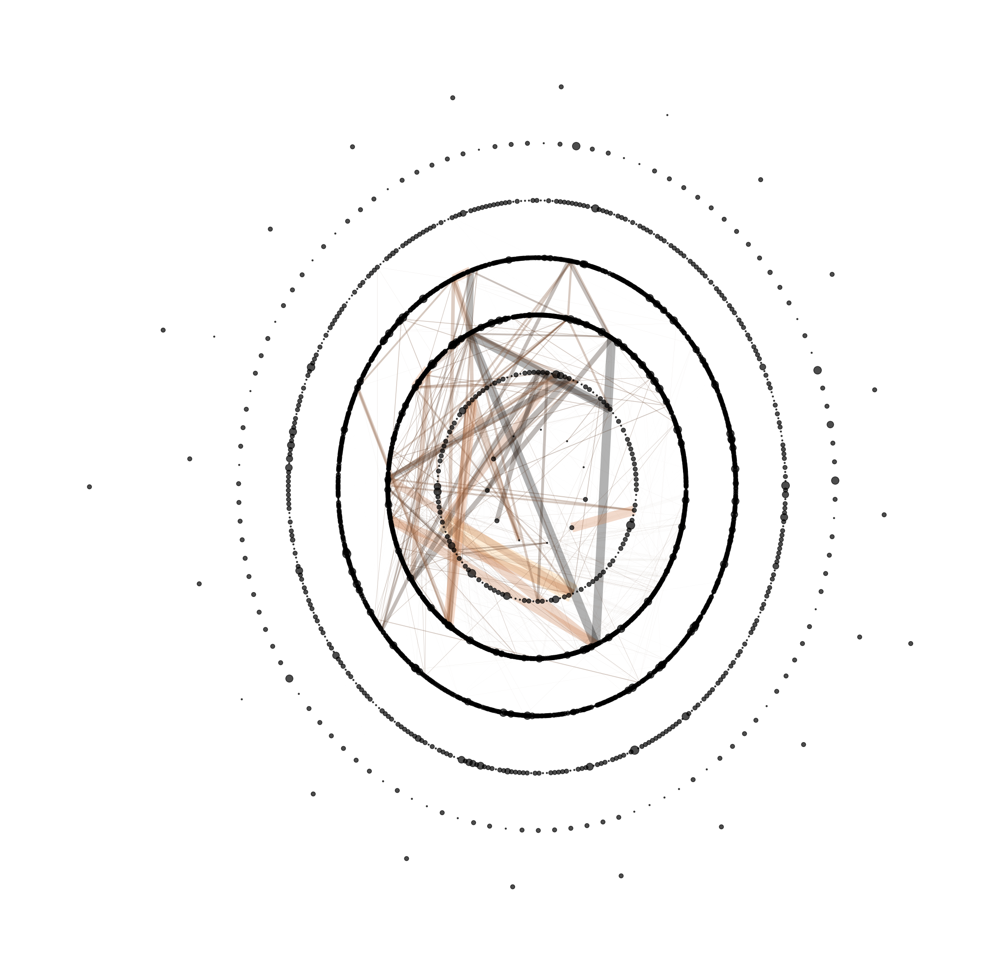

In [48]:
widths = nx.get_edge_attributes(G, 'weight')
sizes = nx.get_node_attributes(G.subgraph(display_nodes), 'size')
nodelist = display_nodes # G.nodes()

plt.figure(figsize=(40,40))

pos = nx.shell_layout(G, nlist=bins)
nx.draw_networkx_nodes(G,pos,
                       nodelist=nodelist,
                       node_size=list(sizes.values()),
                       node_color='black',
                       alpha=0.7)
nx.draw_networkx_edges(G,pos,
                       edgelist = widths.keys(),
                       width=list(widths.values()),
                       edge_color=list(widths.values()),
                       # edge_color='lightblue',
                       alpha=0.3,
                       edge_cmap=plt.cm.copper)
# nx.draw_networkx_labels(G, pos=pos,
#                         labels=dict(zip(nodelist,nodelist)),
#                         font_color='black')
plt.box(False)
plt.show()

# consider shell layout or multipartite

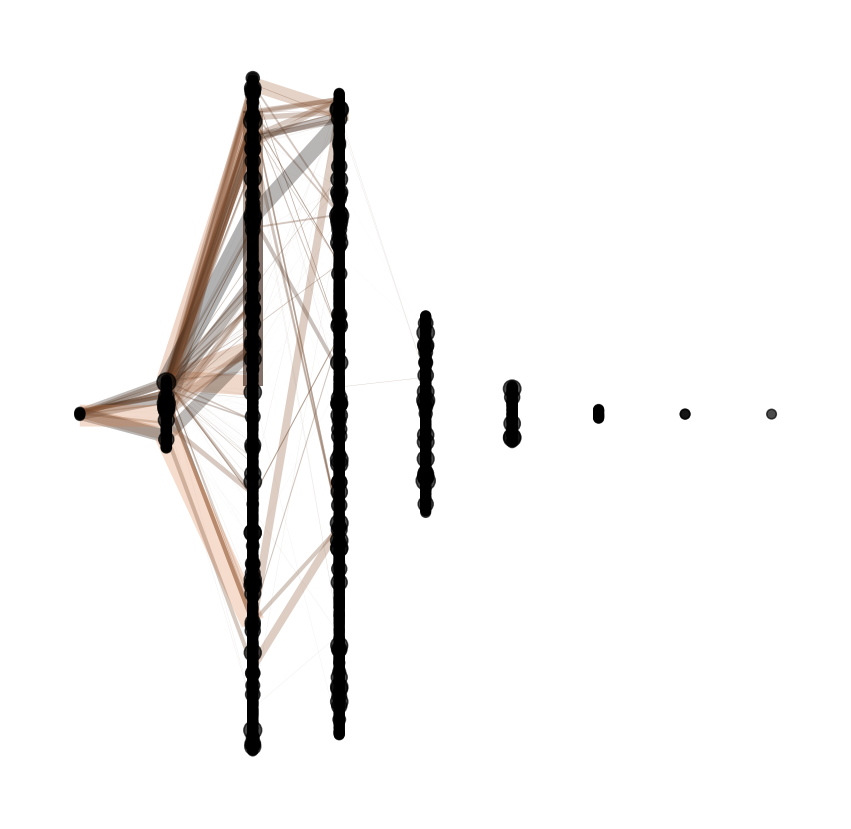

In [49]:
shortest_paths_dict = {key: {'layers': value} for key, value in shortest_paths.items()}

nx.set_node_attributes(G, shortest_paths_dict)

widths = nx.get_edge_attributes(G, 'weight')
sizes = nx.get_node_attributes(G.subgraph(display_nodes), 'size')
nodelist = display_nodes # G.nodes()

plt.figure(figsize=(15,15))

pos = nx.multipartite_layout(G, subset_key='layers')
nx.draw_networkx_nodes(G,pos,
                       nodelist=nodelist,
                       node_size=list(sizes.values()),
                       node_color='black',
                       alpha=0.7)
nx.draw_networkx_edges(G,pos,
                       edgelist = widths.keys(),
                       width=list(widths.values()),
                       edge_color=list(widths.values()),
                       # edge_color='lightblue',
                       alpha=0.3,
                       edge_cmap=plt.cm.copper)
# nx.draw_networkx_labels(G, pos=pos,
#                         labels=dict(zip(nodelist,nodelist)),
#                         font_color='black')
plt.box(False)
plt.show()

# consider shell layout or multipartite

In [50]:
n_bins_target = max(shortest_paths.values()) + 1

In [51]:
bins_dual = [[] for x in range(n_bins_target)]

for key, value in shortest_paths.items():
    if shortest_paths[key] < shortest_paths_target[key]:
        bins_dual[value].append(key)
    else:
        bins_dual[n_bins-1-shortest_paths_target[key]].append(key)

In [52]:
shortest_paths['PTSH-MONOMER[c]']

1

In [53]:
# remove low flux metabolites (unused)
low_flux_nodes = list()

for node in G.nodes():
    weight_sum = 0
    for edge in G.edges(node, data=True):
        weight_sum += edge[2]['weight']
    if weight_sum < 1 and weight_sum > -1: # modify
        low_flux_nodes.append(node)

high_flux_labels = {}    
for node in G.nodes():
    if node not in low_flux_nodes:
        high_flux_labels[node] = node

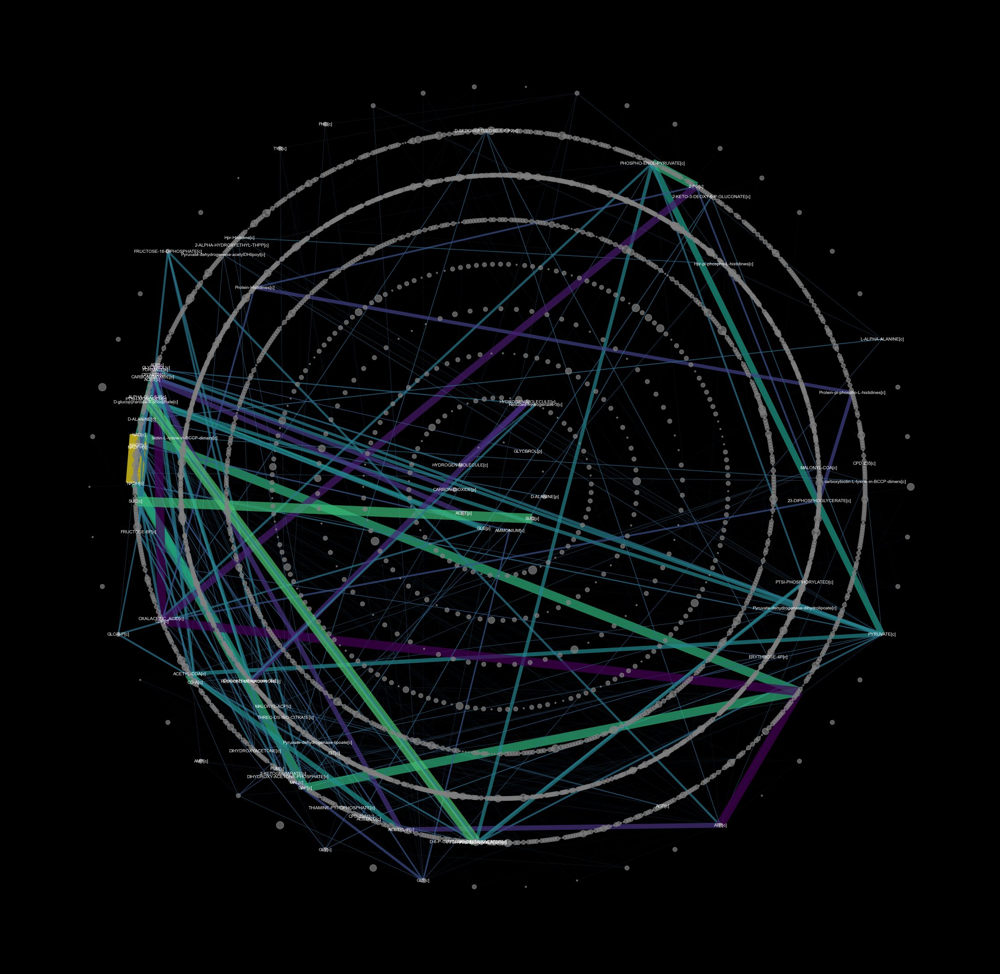

In [54]:
widths = nx.get_edge_attributes(G, 'weight')
sizes = nx.get_node_attributes(G.subgraph(display_nodes), 'size')
nodelist = display_nodes # G.nodes()

plt.figure(figsize=(40,40), facecolor='black')

pos = nx.shell_layout(G, nlist=bins_dual)
nx.draw_networkx_nodes(G,pos,
                       nodelist=nodelist,
                       node_size=list(sizes.values()),
                       node_color='grey',
                       alpha=0.7)
nx.draw_networkx_edges(G,pos,
                       edgelist = widths.keys(),
                       width=list(widths.values()),
                       edge_color=list(widths.values()),
                       # edge_color='lightblue',
                       alpha=0.7,
                       edge_cmap=plt.cm.viridis)
nx.draw_networkx_labels(G, pos=pos,
                        labels=high_flux_labels,
                        font_color='white',
                        font_size=10)
plt.box(False)
plt.grid(False)
plt.show()

# consider shell layout or multipartite

In [55]:
shortest_paths_dict = {}

for i, bin_layer in enumerate(bins_dual):
    for key in bin_layer:
        shortest_paths_dict[key] = {'layers': i}

In [309]:
sdf = pd.DataFrame(list(stoichiometry))
sdf

,reaction id,stoichiometry,is reversible,enzyme
0,1-ACYLGLYCEROL-3-P-ACYLTRANSFER-RXN,"{'ACYL-SN-GLYCEROL-3P[c]': -1, 'ACYL-ACP[c]': ...",False,[1-ACYLGLYCEROL-3-P-ACYLTRANSFER-MONOMER[i]]
1,1.1.1.127-RXN,"{'2-DEHYDRO-3-DEOXY-D-GLUCONATE[c]': -1, 'NAD[...",True,[KDUD-MONOMER[c]]
2,1.1.1.215-RXN (reverse),"{'GLUCONATE[c]': 1, 'NADP[c]': 1, 'CPD-377[c]'...",False,[CPLX0-235[c]]
3,1.1.1.251-RXN,"{'GALACTITOL-1-PHOSPHATE[c]': -1, 'NAD[c]': -1...",True,[CPLX0-8186[c]]
4,1.1.1.271-RXN (reverse),"{'CPD-13118[c]': 1, 'NADP[c]': 1, 'GDP-4-DEHYD...",False,[CPLX0-3881[c]]
...,...,...,...,...
4683,XYLULOKIN-RXN,"{'D-XYLULOSE[c]': -1, 'ATP[c]': -1, 'XYLULOSE-...",False,[CPLX0-7466[c]]
4684,YIAE1-RXN (reverse),"{'5-DEHYDROGLUCONATE[c]': 1, 'NADP[c]': 1, '25...",False,[CPLX0-235[c]]
4685,YIAE2-RXN (reverse),"{'CPD-377[c]': 1, 'NADPH[c]': 1, 'PROTON[c]': ...",False,[]
4686,glycogen-monomer-extension,"{'glycogen-monomer[c]': 1, 'ADP-D-GLUCOSE[c]':...",False,[]


In [314]:
index = sdf['reaction id'].str.contains('ISOCIT-CLEAV')
sdf[index]

,reaction id,stoichiometry,is reversible,enzyme
1091,ISOCIT-CLEAV-RXN,"{'THREO-DS-ISO-CITRATE[c]': -1, 'GLYOX[c]': 1,...",True,[ISOCIT-LYASE[c]]
